## Лабораторная 1. Коннектом мозга человека

Дорогие студенты!

В первой лабораторной работе мы предлагаем вам исследовать коннектом мозга человека, полученный в рамках проекта __[Human Connectome Project (HCP)](https://www.humanconnectome.org/)__ (в __[этой статье](https://link.springer.com/article/10.1007/s11571-017-9445-1)__).

Вам __[даны несколько файлов](https://drive.google.com/drive/folders/1aLmWQfYGP5jOa0cojA5zgpPP3sMeso_Li7r9KZaJ6GVSpMupYsIjeBmKa3oZ69LXiuSaWyul?usp=sharing)__ для одного и того же коннектома в различных разрешениях - на случай, если вы захотите подебажить код на маленьких графах, или использовать какие-нибудь очень тяжёлые алгоритмы.

Но, желательно представить итоговые результаты для самого большого разрешения коннектома.

Сумма баллов за все задания: `100`

In [80]:
pip install powerlaw

In [81]:
from collections import defaultdict
from typing import Union
import os.path as osp
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import networkx as nx
import powerlaw
import numpy as np

### Вспомогательные функции

In [82]:
def translate_key(
    key: str,
    map: dict[str, str] = None,
) -> str:
    """
    Translates a given key using a provided mapping dictionary.
    If the key is not found in the mapping, the original key is returned.

    Args:
        key (str):
            The key to be translated.
        map (dict[str, str], optional):
            A dictionary where keys are original names and values are their translations.
            Defaults to an empty dictionary if not provided.

    Returns:
        str: The translated key if found in the dictionary; otherwise, the original key.
    """
    if map is None:
        map = {
            "Right": "Правое полушарие",
            "Left": "Левое полушарие",
            "Cortical": "Корковая область",
            "Subcortical": "Подкорковая область",
            "Parstriangularis": "Треугольная часть лобной доли",
            "Precentral": "Прецентральная извилина",
            "Superiorparietal": "Верхняя теменная область",
            "Lateraloccipital": "Латеральная затылочная область",
            "Entorhinal": "Энторинальная кора",
            "Left-pallidum": "Бледный шар (лев.)",
            "Right-pallidum": "Бледный шар (прав.)",
            "Posteriorcingulate": "Задняя поясная кора",
            "Caudalmiddlefrontal": "Задняя средняя лобная кора",
            "Right-thalamus-proper": "Таламус (прав.)",
            "Left-thalamus-proper": "Таламус (лев.)",
            "Left-amygdala": "Миндалина (лев.)",
            "Right-amygdala": "Миндалина (прав.)",
            "Parsopercularis": "Оперкулярная часть лобной доли",
            "Caudalanteriorcingulate": "Задняя передняя поясная кора",
            "Parsorbitalis": "Орбитальная часть лобной доли",
            "Medialorbitofrontal": "Медиальная орбитофронтальная кора",
            "Right-accumbens-area": "Область прилежащего ядра (прав.)",
            "Left-accumbens-area": "Область прилежащего ядра (лев.)",
            "Lingual": "Язычная извилина",
            "Right-caudate": "Хвостатое ядро (прав.)",
            "Left-caudate": "Хвостатое ядро (лев.)",
            "Postcentral": "Постцентральная извилина",
            "Temporalpole": "Полюс височной доли",
            "Precuneus": "Предклинье",
            "Middletemporal": "Средняя височная извилина",
            "Transversetemporal": "Поперечная височная извилина",
            "Insula": "Островковая кора",
            "Paracentral": "Парацентральная долька",
            "Left-putamen": "Путамен (лев.)",
            "Right-putamen": "Путамен (прав.)",
            "Lateralorbitofrontal": "Латеральная орбитофронтальная кора",
            "Isthmuscingulate": "Перешеек поясной коры",
            "Fusiform": "Веретенообразная извилина",
            "Rostralmiddlefrontal": "Ростральная средняя лобная кора",
            "Supramarginal": "Надкраевая извилина",
            "Right-hippocampus": "Гиппокамп (прав.)",
            "Left-hippocampus": "Гиппокамп (лев.)",
            "Cuneus": "Клиновидная кора",
            "Bankssts": "Область верхней височной борозды",
            "Frontalpole": "Полюс лобной доли",
            "Superiortemporal": "Верхняя височная извилина",
            "Inferiorparietal": "Нижняя теменная доля",
            "Pericalcarine": "Околошпорная кора",
            "Parahippocampal": "Парагиппокампальная извилина",
            "Brain-stem": "Ствол мозга",
            "Superiorfrontal": "Верхняя лобная извилина",
            "Rostralanteriorcingulate": "Ростральная передняя поясная кора",
            "Inferiortemporal": "Нижняя височная извилина",
        }

    return map.get(key, key)


def brain_area_function(
    brain_area_name: str,
    map: dict[str, str] = None,
) -> str:
    """
    Retrieves the function of a brain area by mapping its name through a provided dictionary.
    If the brain area name is not found, returns the original name.

    Args:
        brain_area_name (str):
            The name of the brain area.
        map (dict[str, str], optional):
            A dictionary mapping brain area names to their respective functions.
            Defaults to an empty dictionary if not provided.

    Returns:
        str: The mapped function of the brain area if available, otherwise the original name.
    """
    if map is None:
        map = {
            "Cortical": "Высшие когнитивные функции, мышление",
            "Subcortical": "Регуляция движений, эмоции, память",
            "Parstriangularis": "Обработка речи, понимание языка",
            "Precentral": "Контроль движений (моторная кора)",
            "Superiorparietal": "Пространственное восприятие, внимание",
            "Lateraloccipital": "Обработка зрительной информации",
            "Entorhinal": "Формирование памяти, связь с гиппокампом",
            "Left-pallidum": "Движения, регулирование моторных функций",
            "Right-pallidum": "Движения, регулирование моторных функций",
            "Posteriorcingulate": "Память, внимание, ориентирование",
            "Caudalmiddlefrontal": "Планирование, когнитивный контроль",
            "Right-thalamus-proper": "Передача сенсорных сигналов в кору",
            "Left-thalamus-proper": "Передача сенсорных сигналов в кору",
            "Left-amygdala": "Эмоции, страх, агрессия",
            "Right-amygdala": "Эмоции, страх, агрессия",
            "Parsopercularis": "Производство речи, обработка звуков",
            "Caudalanteriorcingulate": "Контроль эмоций, принятие решений",
            "Parsorbitalis": "Регуляция поведения, социальные взаимодействия",
            "Medialorbitofrontal": "Обучение, оценка вознаграждения",
            "Right-accumbens-area": "Мотивация, система вознаграждения",
            "Left-accumbens-area": "Мотивация, система вознаграждения",
            "Lingual": "Обработка визуальной информации",
            "Right-caudate": "Контроль движений, обучение",
            "Left-caudate": "Контроль движений, обучение",
            "Postcentral": "Сенсорная информация, осязание",
            "Temporalpole": "Память, обработка эмоций",
            "Precuneus": "Сознание, самосознание, внимание",
            "Middletemporal": "Обработка слуха, зрительной информации",
            "Transversetemporal": "Анализ звуков и речи",
            "Insula": "Ощущения тела, эмоции, восприятие боли",
            "Paracentral": "Контроль движений ног и туловища",
            "Left-putamen": "Движения, формирование навыков",
            "Right-putamen": "Движения, формирование навыков",
            "Lateralorbitofrontal": "Контроль эмоций, принятие решений",
            "Isthmuscingulate": "Эмоции, память, регуляция поведения",
            "Fusiform": "Распознавание лиц, объектов",
            "Rostralmiddlefrontal": "Планирование, принятие решений",
            "Supramarginal": "Понимание речи, сенсомоторная интеграция",
            "Right-hippocampus": "Формирование долгосрочной памяти",
            "Left-hippocampus": "Формирование долгосрочной памяти",
            "Cuneus": "Обработка зрительных стимулов",
            "Bankssts": "Анализ речи, восприятие звуков",
            "Frontalpole": "Абстрактное мышление, планирование",
            "Superiortemporal": "Обработка речи и звуков",
            "Inferiorparietal": "Интеграция слуха, зрения, внимания",
            "Pericalcarine": "Первичная зрительная кора, обработка изображения",
            "Parahippocampal": "Память, ориентация в пространстве",
            "Brain-stem": "Жизненно важные функции (дыхание, сердце)",
            "Superiorfrontal": "Контроль внимания, моторное планирование",
            "Rostralanteriorcingulate": "Эмоции, контроль поведения",
            "Inferiortemporal": "Распознавание объектов, обработка зрительных образов",
        }

    return map.get(brain_area_name, brain_area_name)


def canonize_key(
    key: str,
) -> str:
    """
    Converts a given key into a standardized format by:
    - Removing hemisphere indicators (`lh`, `rh`).
    - Replacing periods with underscores.
    - Stripping numerical suffixes.
    - Capitalizing the first letter.

    Args:
        key (str):
            The key to be standardized.

    Returns:
        str: A canonized version of the key.
        ```
    """
    splitted_key = list(filter(
        lambda s: s not in ['lh', 'rh'],
        key.lower().replace('.', '_').split('_')
    ))

    canonized_key = splitted_key[0] if splitted_key else key
    canonized_key = canonized_key.rstrip('0123456789').capitalize()

    return canonized_key


def get_neuron_info(
    neuron_data: dict[str, str],
    map: dict[str, str] = None,
) -> tuple[str, str, str, str]:
    """
    Extracts and standardizes neuron information, including its region, name, hemisphere,
    and function, using optional mapping.

    Args:
        neuron_data (dict[str, str]):
            A dictionary containing neuron attributes, including:
            - "dn_region": The region where the neuron is located.
            - "dn_name": The name of the neuron.
            - "dn_hemisphere": The hemisphere (left/right) where the neuron is located.
        map (dict[str, str], optional):
            A dictionary mapping neuron attributes to their standardized values.
            Defaults to an empty dictionary if not provided.

    Returns:
        tuple[str, str, str, str]: A tuple containing:
            - Standardized region name.
            - Standardized neuron name.
            - Standardized hemisphere.
            - Mapped function of the neuron.
        ```
    """

    region = canonize_key(neuron_data.get('dn_region', 'N/A'))
    name = canonize_key(neuron_data.get('dn_name', 'N/A'))
    hemisphere = canonize_key(neuron_data.get('dn_hemisphere', 'N/A'))
    function = brain_area_function(name, map=map)

    return (
        translate_key(region, map=map),
        translate_key(name, map=map),
        translate_key(hemisphere, map=map),
        function,
    )


In [83]:
def get_node_colors(
    node_attrs: list,
) -> list:
    """
    Assigns RGB colors to unique node attributes and returns a list of corresponding colors.

    Args:
        node_attrs (list):
            A list of node attributes, where each attribute represents a category.
            Nodes with the same attribute will be assigned the same color.

    Returns:
        list:
            A list of RGB color strings (formatted as "rgb(R, G, B)") corresponding to each
            attribute in the input list.
    """

    # Obtain unique attributes
    unique_attrs = list(set(node_attrs))

    # Assign RGB colors to the attributes
    cmap = plt.get_cmap("turbo", len(unique_attrs))
    color_map = {
        attr: f"rgb({int(cmap(i)[0]*255)}, {int(cmap(i)[1]*255)}, {int(cmap(i)[2]*255)})"
        for i, attr in enumerate(unique_attrs)
    }

    # Assign corresponding colors to the nodes
    node_colors = [color_map[attr] for attr in node_attrs]

    return node_colors


In [84]:
def plot_connectome(
    G: nx.Graph,
    node_colors: Union[str, list[str]] = 'red',
    show_legend: bool = True,
):
    """
    Plots a 3D connectome graph based on node positions and connectivity.

    Args:
        G:
            A NetworkX graph containing nodes with attributes 'dn_position_x',
            'dn_position_y', and 'dn_position_z'.
        node_colors (str or list, optional):
            The color(s) assigned to nodes. Can be a single color or a list matching
            the number of nodes.
        show_legend (bool, optional):
            Whether to display a legend grouping nodes by color. Defaults to True.

    Returns:
        None: Displays an interactive 3D plot of the connectome.
    """

    # Extract node positions
    positions = {node: (
        float(data['dn_position_x']),
        float(data['dn_position_y']),
        float(data['dn_position_z'])
        )
        for node, data in G.nodes(data=True)
    }

    # Edges coordinates
    edge_x = []
    edge_y = []
    edge_z = []

    for edge in G.edges():
        x0, y0, z0 = positions[edge[0]]
        x1, y1, z1 = positions[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_z.extend([z0, z1, None])

    # Nodes coordinates
    node_x = [pos[0] for pos in positions.values()]
    node_y = [pos[1] for pos in positions.values()]
    node_z = [pos[2] for pos in positions.values()]

    # Additional node info
    node_info = [
        "Region: {0}<br>Name: {1}<br>Hemisphere: {2}<br>Function: {3}".format(*get_neuron_info(data))
        for node, data in G.nodes(data=True)
    ]

    # Create 3D plot
    fig = go.Figure(layout={'width': 1200, 'height': 800})

    # Plot edges
    fig.add_trace(go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        mode='lines',
        line=dict(color='rgba(0, 0, 255, 0.1)', width=1),
        name='edges',
        hoverinfo='skip',
        showlegend=False,
    ))

    # Plot nodes
    fig.add_trace(go.Scatter3d(
        x=node_x, y=node_y, z=node_z,
        mode='markers',
        marker=dict(size=5, color=node_colors),
        text=node_info,
        hoverinfo='text',
        name='nodes',
        showlegend=False,
    ))

    # Configure plot appearance
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="Brain Connectome"
    )

    # Group nodes by color for legend
    color_groups = defaultdict(list)
    for node, color in zip(G.nodes(), node_colors):
        region, name, hemisphere, function = get_neuron_info(G.nodes[node])
        color_groups[color].append(name)

    if show_legend:
        for color, nodes in color_groups.items():
            fig.add_trace(go.Scatter3d(
                x=[None], y=[None], z=[None],
                mode='markers',
                marker=dict(size=5, color=color),
                name=f"{'<br>'.join(set(nodes))}",
                hoverinfo='skip',
                legendwidth=3,
            ))

        fig.update_layout(
            legend=dict(
                x=1.05,
                y=1,
                xanchor="left",
                yanchor="top",
                bgcolor="rgba(255, 255, 255, 0.7)",
                font=dict(size=10),
                itemwidth=30,
                bordercolor="black",
                borderwidth=1,
                tracegroupgap=5,
            )
        )

    fig.show()


## 0. Пример работы с коннектомом

In [85]:
graph_path = osp.join(".", "brain_3_scale500.graphml")
G = nx.read_graphml(graph_path)

In [86]:
# Extract unique regions and assign colors
color_by='dn_name'
node_names = [
    canonize_key(data.get(color_by, 'Unknown'))
    for node, data in G.nodes(data=True)
]
node_colors = get_node_colors(node_names)

# Plot the connectome
plot_connectome(G, node_colors=node_colors)

## Задание 1. Анализ графа (25 баллов)

### 1.1. Основные характеристики графа, коэффициент кластеризации

- Выделите из графа наибольшую связную компоненту. Здесь и далее в лабораторной мы будем работать с ней.

- Посчитайте основные характеристики графа (коэффициент кластеризации, диаметр, радиус, среднюю длину кратчайшего пути)

- Постройте гистограмму распределения коэффициентов кластеризации отдельных вершин

- Постройте график зависимости коэффициента кластеризации от степени вершины

In [87]:
Gcc = G.subgraph(max(nx.connected_components(G), key=len)).copy()
print(f'Размер наибольшей связной компоненты: {len(Gcc)}')

Размер наибольшей связной компоненты: 816


In [88]:
def clustering_coefficient(G):
    return nx.average_clustering(G)

def graph_diameter(G):
    return nx.diameter(G)

def graph_radius(G):
    return nx.radius(G)

def average_shortest_path_length(G):
    return nx.average_shortest_path_length(G)

In [89]:
print(f"Средний коэффициент кластеризации: {clustering_coefficient(Gcc)}")

print(f"Диаметр: {graph_diameter(Gcc)}")

print(f"Радиус: {graph_radius(Gcc)}")

print(f"Средняя длина кратчайшего пути: {average_shortest_path_length(Gcc)}")

Средний коэффициент кластеризации: 0.6240820633272073
Диаметр: 8
Радиус: 4
Средняя длина кратчайшего пути: 3.080897389630699


In [90]:
clustering = nx.clustering(Gcc)
clustering_vals = list(clustering.values())

degrees = dict(Gcc.degree())
degree_vals = [degrees[node] for node in Gcc.nodes()]

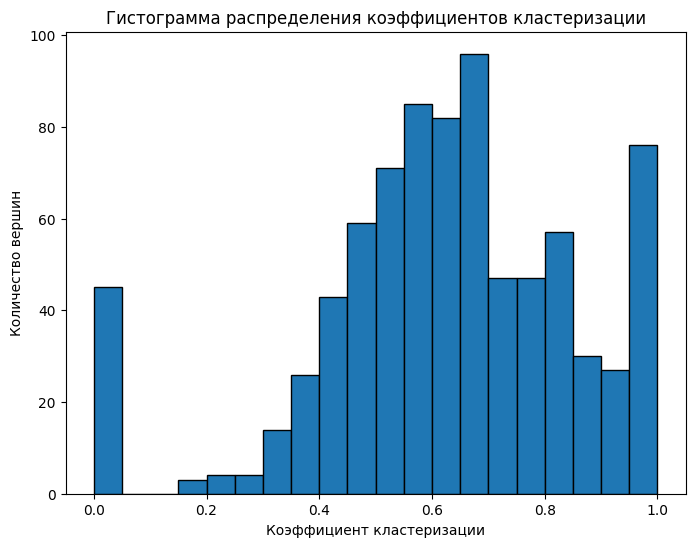

In [91]:
plt.figure(figsize=(8, 6))
plt.hist(clustering_vals, bins=20, edgecolor='black')
plt.xlabel('Коэффициент кластеризации')
plt.ylabel('Количество вершин')
plt.title('Гистограмма распределения коэффициентов кластеризации')
plt.show()

Text(0.5, 1.0, 'Зависимость коэффициента кластеризации от степени вершины')

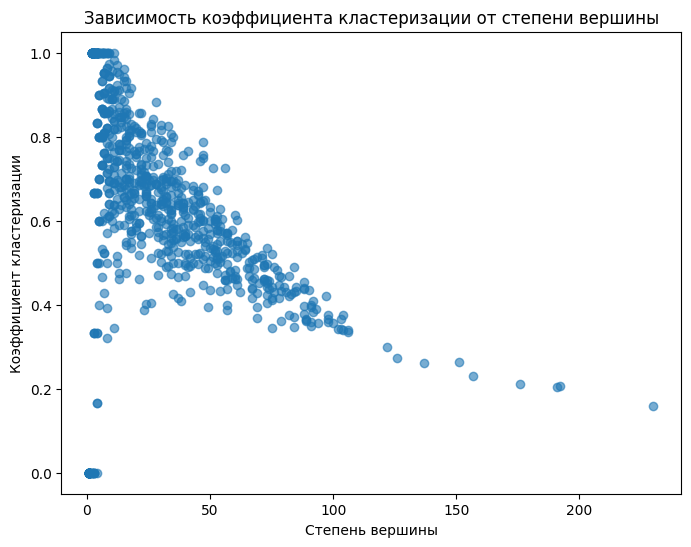

In [92]:
plt.figure(figsize=(8, 6))
plt.scatter(degree_vals, clustering_vals, alpha=0.6)
plt.xlabel('Степень вершины')
plt.ylabel('Коэффициент кластеризации')
plt.title('Зависимость коэффициента кластеризации от степени вершины')

### 1.2. Длина пути

- Посчитайте среднюю длину кратчайшего пути между двумя вершинами графа

- Постройте гистограмму зависимости средней длины кратчайшего пути от степени вершины

In [93]:
print(f"Средняя длина кратчайшего пути: {average_shortest_path_length(Gcc)}")

Средняя длина кратчайшего пути: 3.080897389630699


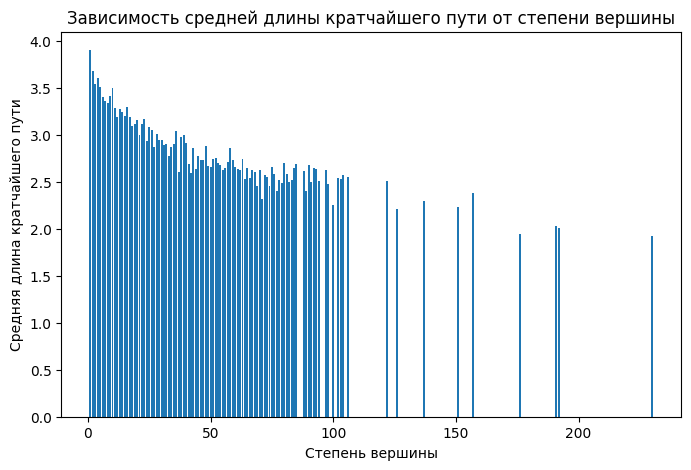

In [94]:
node_avg_path = {}
for node in Gcc.nodes():
    path_lengths = nx.single_source_shortest_path_length(Gcc, node)
    avg_len = np.mean(list(path_lengths.values()))
    node_avg_path[node] = avg_len

degree_to_avg_paths = {}
for node, avg_len in node_avg_path.items():
    deg = Gcc.degree(node)
    degree_to_avg_paths.setdefault(deg, []).append(avg_len)

degrees = sorted(degree_to_avg_paths.keys())
avg_paths_by_degree = [np.mean(degree_to_avg_paths[d]) for d in degrees]

plt.figure(figsize=(8, 5))
plt.bar(degrees, avg_paths_by_degree)
plt.xlabel("Степень вершины")
plt.ylabel("Средняя длина кратчайшего пути")
plt.title("Зависимость средней длины кратчайшего пути от степени вершины")
plt.show()

### 1.3. Распределение степеней вершин

- Какое распределение имеют степени вершин? Проведите анализ распределения степенй вершин и найдите параметры этого распределения

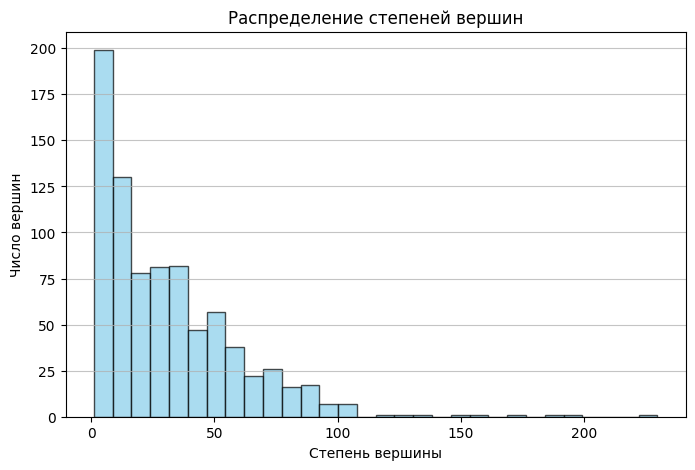

In [95]:
degrees = np.array([d for _, d in Gcc.degree()])

plt.figure(figsize=(8, 5))
plt.hist(degrees, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title("Распределение степеней вершин")
plt.xlabel("Степень вершины")
plt.ylabel("Число вершин")
plt.grid(axis='y', alpha=0.75)
plt.show()

На первый взгляд кажется, что распределение степенное, но надо это проверить:

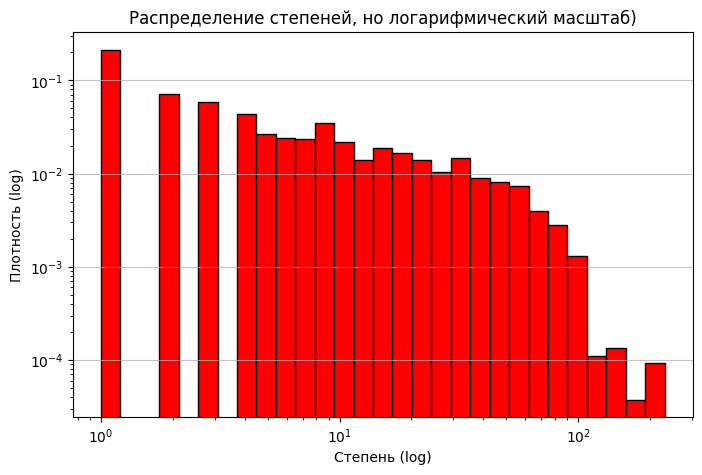

In [96]:
plt.figure(figsize=(8, 5))
plt.hist(degrees, bins=np.logspace(0, np.log10(max(degrees)), 30), density=True, color='red', edgecolor='black')
plt.xscale('log')
plt.yscale('log')
plt.title("Распределение степеней, но логарифмический масштаб)")
plt.xlabel("Степень (log)")
plt.ylabel("Плотность (log)")
plt.grid(axis='y', alpha=0.75)
plt.show()

Ну что-то вообще не прямая, согласитесь. Но надо бы проверить с помощью метода Clauset-Shalizi-Newman'a, чтобы уж наверняка:

In [97]:
from scipy import optimize, special

def discrete_neg_log_likelihood(alpha, tail, xmin):
    """
    Вычисляем отрицательное логарифмическое правдоподобие для степенного закона.

    tail: массив данных с x >= xmin
    alpha: параметр
    xmin: минимальное значение x
    Формула:
        - L = alpha * sum(log(k_i)) + n * log(zeta(alpha, xmin))
    """
    n = len(tail)
    if alpha <= 1:
        return np.inf
    return alpha * np.sum(np.log(tail)) + n * np.log(special.zeta(alpha, xmin))

def estimate_alpha_discrete(degrees, xmin):
    """
    Оцениваем параметр alpha для степенного закона по данным с x >= xmin.

    degrees: массив степеней
    xmin: кандидат для минимальной степени
    """
    tail = degrees[degrees >= xmin]
    if len(tail) == 0:
        return None
    result = optimize.minimize_scalar(
        discrete_neg_log_likelihood,
        args=(tail, xmin),
        bounds=(1.0001, 10),
        method='bounded'
    )
    if result.success:
        return result.x
    else:
        return None

def ks_distance_discrete(degrees, xmin, alpha):
    """
    Вычисляем KS-статистику для степенного закона.

    degrees: массив степеней
    xmin: кандидат для минимальной степени
    alpha: оценка параметра
    Сравниваем эмпирическая CDF хвоста (x >= xmin) с теоретической CDF,
    вычисленной как:
       F(k) = (sum_{x=xmin}^{k} x^{-alpha}) / zeta(alpha, xmin).
    """
    tail = np.sort(degrees[degrees >= xmin])
    n = len(tail)
    if n == 0:
        return np.inf

    empirical_cdf = np.arange(1, n+1) / n

    x_max = int(np.max(tail))
    k_range = np.arange(xmin, x_max+1)
    Z = special.zeta(alpha, xmin)
    pmf = k_range ** (-alpha) / Z
    cdf_theoretical_values = np.cumsum(pmf)

    theoretical_cdf = np.array([cdf_theoretical_values[int(x - xmin)] for x in tail])

    return np.max(np.abs(empirical_cdf - theoretical_cdf))

def sample_from_discrete_powerlaw(xmin, alpha):
    """
    Генерируем одно случайное значение из действительно степенного закона с параметрами xmin и alpha,
    используя метод инверсии через последовательное суммирование.
    """
    u = np.random.rand()
    Z = special.zeta(alpha, xmin)
    cumulative = 0.0
    k = xmin
    while True:
        p = k ** (-alpha) / Z
        cumulative += p
        if cumulative >= u:
            return k
        k += 1

def generate_synthetic_data_discrete(degrees, xmin, alpha):
    """
    Генерируем синтетическую выборку для дискретного степенного закона.

    Для x < xmin оставляем оригинальные значения,
    для x >= xmin генерируем новые значения из распределения:
        p(x) = x^(-alpha) / zeta(alpha, xmin)
    """
    degrees = np.array(degrees)
    mask = degrees < xmin
    n_tail = np.sum(~mask)
    synthetic_tail = np.array([sample_from_discrete_powerlaw(xmin, alpha) for _ in range(n_tail)])
    return np.concatenate((degrees[mask], synthetic_tail))

def fit_power_law_single_discrete(degrees):
    """
    Подгоняем дискретный степенной закон к данным, перебирая xmin и выбирая тот,
    для которого KS-статистика минимальна.
    """
    degrees = np.array(degrees)
    unique_vals = np.sort(np.unique(degrees))
    best_ks = np.inf
    best_xmin = None
    best_alpha = None
    for xmin in unique_vals:
        tail = degrees[degrees >= xmin]
        if len(tail) < 10:
            continue
        alpha = estimate_alpha_discrete(degrees, xmin)
        if alpha is None:
            continue
        ks = ks_distance_discrete(degrees, xmin, alpha)
        if ks < best_ks:
            best_ks = ks
            best_xmin = xmin
            best_alpha = alpha
    if best_xmin is None:
        raise ValueError("Не удалось найти подходящий xmin (слишком мало данных в хвосте).")
    return {'xmin': best_xmin, 'alpha': best_alpha, 'ks': best_ks}

def fit_power_law_discrete(degrees, n_bootstraps=250):
    """
    Основная функция - перебираем xmin, выбираем тот, для которого KS-статистика минимальна,
    затем проводим бутстреп-подход для оценки p-value.
    """
    degrees = np.array(degrees)
    unique_vals = np.sort(np.unique(degrees))
    best_ks = np.inf
    best_xmin = None
    best_alpha = None
    for xmin in unique_vals:
        tail = degrees[degrees >= xmin]
        if len(tail) < 10:
            continue
        alpha = estimate_alpha_discrete(degrees, xmin)
        if alpha is None:
            continue
        ks = ks_distance_discrete(degrees, xmin, alpha)
        if ks < best_ks:
            best_ks = ks
            best_xmin = xmin
            best_alpha = alpha
    if best_xmin is None:
        raise ValueError("Не удалось найти подходящий xmin (слишком мало данных в хвосте).")

    ks_synthetic = []
    for _ in range(n_bootstraps):
        synthetic_degrees = generate_synthetic_data_discrete(degrees, best_xmin, best_alpha)
        try:
            res = fit_power_law_single_discrete(synthetic_degrees)
            ks_synthetic.append(res['ks'])
        except Exception:
            continue
    ks_synthetic = np.array(ks_synthetic)
    if len(ks_synthetic) == 0:
        p_value = np.nan
    else:
        p_value = np.sum(ks_synthetic > best_ks) / len(ks_synthetic)

    return {'xmin': best_xmin, 'alpha': best_alpha, 'ks': best_ks, 'p_value': p_value}


result = fit_power_law_discrete(degrees, n_bootstraps=250)
print("Оптимальное xmin =", result['xmin'])
print("Оценка alpha =", result['alpha'])
print("KS-статистика =", result['ks'])
print("p-value =", result['p_value'])

Оптимальное xmin = 72
Оценка alpha = 5.271043274497047
KS-статистика = 0.06845174562606027
p-value = 0.348


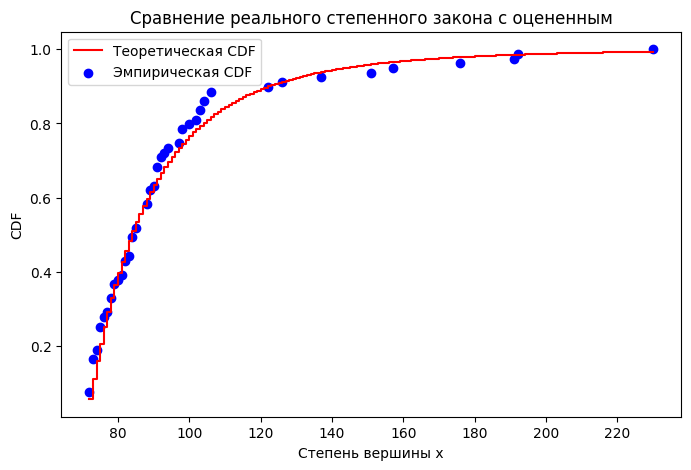

In [98]:
tail = np.sort(degrees[degrees >= result['xmin']])
n_tail = len(tail)
empirical_cdf = np.arange(1, n_tail+1) / n_tail

k_max = int(np.max(tail))
k_range = np.arange(result['xmin'], k_max+1)
Z = special.zeta(result['alpha'], result['xmin'])
pmf = k_range ** (-result['alpha']) / Z
theoretical_cdf = np.cumsum(pmf)

plt.figure(figsize=(8, 5))
plt.step(np.arange(result['xmin'], k_max+1), theoretical_cdf, label='Теоретическая CDF', where='post', color='red')

unique_tail = np.unique(tail)
empirical_cdf_unique = [np.sum(tail <= k) / n_tail for k in unique_tail]
plt.scatter(unique_tail, empirical_cdf_unique, label='Эмпирическая CDF', color='blue')
plt.xlabel('Степень вершины х')
plt.ylabel('CDF')
plt.title('Сравнение реального степенного закона с оцененным')
plt.legend()
plt.show()

Хм, мы в целом видим, что распределение действительно степенное с параметрами $\alpha$ $=$ $5,27$ и $x_{min}$ $=$ $72$, однако давайте еще на всякий случай проверим все это дело с помощью крутой библотеки powerlaw:

In [99]:
fit = powerlaw.Fit(degrees)

print("Оценка параметра alpha:", fit.power_law.alpha)
print("Оценка параметра xmin:", fit.power_law.xmin)

Calculating best minimal value for power law fit
Оценка параметра alpha: 5.400556610468805
Оценка параметра xmin: 72.0


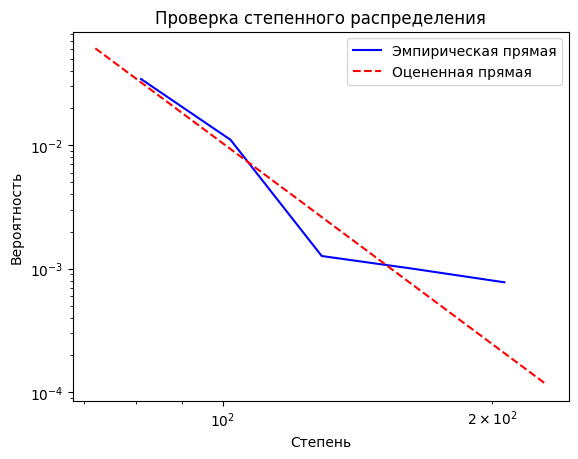

In [100]:
fig = fit.plot_pdf(color='b', label='Эмпирическая прямая')
fit.power_law.plot_pdf(color='r', linestyle='--', ax=fig, label='Оцененная прямая')
plt.legend()
plt.xlabel("Степень")
plt.ylabel("Вероятность")
plt.title("Проверка степенного распределения")
plt.show()

In [101]:
print(f'Мы в таком случае обрезаем {len([x for x in degrees if x < 72])/len(degrees)*100:.2f}% данных')

Мы в таком случае обрезаем 90.32% данных


Как мы видим, в сравнении с мощной библиотекой powerlaw мы очень хорошо оценили $\alpha$ и $x_{min}$, однако при $x_{min} = 72$ мы обрезаем 90% данных, что может говорить нам о том, что исходные данные сильно зашумлены, что и неудивительно, ведь мы не можем абсолютно точно считать каждый нейрон в нашем мозге, или же присутствует еще какое-то распределение, которое вносит свою "меру хаоса" в степени вершин (скорее всего, это экспоненциальное или логнормальное)

Но не будем о грустном, у нас вышло степенное распределение! УРА!

### 1.4. Определите, какие в нашем мозге наиболее важные и значимые нейроны?

Строго говоря, мер важности нейрона много - можно считать, что важен тот нейрон, в которых приходят и уходят много сигналов (значит, он часто используется), а также важен тот который связывает нейроны с большим числом связей (иначе мы бы просто не могли думать, сигнал бы не доходил), но и не менее важен нейрон, который связан с нейроном с большим числом связей (значит, он выполняет какую-то не очень частую, но важную функцию), поэтому нам надо оценить все эти факторы:


In [102]:
betweenness = nx.betweenness_centrality(Gcc)
eigenvector = nx.eigenvector_centrality(Gcc)
pagerank = nx.pagerank(Gcc)

combined_centrality = {
    node: betweenness[node] + eigenvector[node] + pagerank[node]
    for node in Gcc.nodes()
}

hubs = sorted(combined_centrality, key=combined_centrality.get, reverse=True)[:10]

for idx, node in enumerate(hubs, start=1):
    print(f"{idx} нейрон:")
    region, name, hemisphere, function = get_neuron_info(Gcc.nodes[node])
    print(f"Отдел мозга: {name}")
    print(f"Область мозга: {region}")
    print(f"Полушарие: {hemisphere}")
    print(f"Функция: {function}")
    print(f"Pagerank: {pagerank[node]}")
    print(f"Betweenness centrality: {betweenness[node]}")
    print(f"Eigenvector centrality: {eigenvector[node]}")
    print(f"Суммарная центральность: {combined_centrality[node]}\n")


1 нейрон:
Отдел мозга: Таламус (лев.)
Область мозга: Подкорковая область
Полушарие: Левое полушарие
Функция: Передача сенсорных сигналов в кору
Pagerank: 0.006273492868091373
Betweenness centrality: 0.150340454693192
Eigenvector centrality: 0.18456956425134943
Суммарная центральность: 0.3411835118126328

2 нейрон:
Отдел мозга: Таламус (прав.)
Область мозга: Подкорковая область
Полушарие: Правое полушарие
Функция: Передача сенсорных сигналов в кору
Pagerank: 0.00570229664219746
Betweenness centrality: 0.21174195931929976
Eigenvector centrality: 0.11018314204332255
Суммарная центральность: 0.32762739800481977

3 нейрон:
Отдел мозга: Хвостатое ядро (прав.)
Область мозга: Подкорковая область
Полушарие: Правое полушарие
Функция: Контроль движений, обучение
Pagerank: 0.008113532737249978
Betweenness centrality: 0.20322171868611696
Eigenvector centrality: 0.09947687940126908
Суммарная центральность: 0.310812130824636

4 нейрон:
Отдел мозга: Хвостатое ядро (лев.)
Область мозга: Подкорковая обл

### 1.5. Является ли мозг человека сложной сетью? Почему?

In [103]:
print(f"\nГлобальный коэффициент кластеризации: {nx.average_clustering(Gcc):.3f}")


Глобальный коэффициент кластеризации: 0.624


Как нам вещал Громов на лекциях, у нас есть несколько признаков того, что граф является сложной сетью: у него степенное распределение степеней вершин, это малый мир (малое среднее расстояние между вершинами, малый диаметр), высокая клайстеризация, выраженные структуры сообществ.

То, что в графе у нас степенное распределение, мы доказали.

Среднее расстояние между вершинами равно 3, что очень мало по сравнению с размерами графа, диаметр тоже асимптотически мал - 8, то есть наш граф (т.е. мозг) - малый мир.

Средний коэффициент клайстеризации у нас 0,6, что является высоким показателем.

Про выраженные структуры сообщества мы еще (формально) ничего не знаем, но, воспользовавшись условием, мы можем понять, что у нас есть какая-то разметка графа на области, т.е. фактически на сообщества.

Все пункты по Громову выполняются, значит, наш мозг - это сложная сеть!

## Задание 2. Разметка коннектома мозга (30 баллов)

- Постройте автоматическую разметку конектома мозга. Под разметкой имеется в виду разделение коннектома на некоторое число областей, и соотнесение каждой вершины с одной из областей.

- Попробуйте несколько различных алгоритмов разметки. Если у алгоритмов есть параметры - опишите, как вы выбирали их значения

- Сравните результаты работы алгоритмов между собой, и с истинной разметкой

Для начала получим истинную разметку, т.е. принадлежность нейрона той или иной области:

In [104]:
true_labels_str = [canonize_key(Gcc.nodes[node].get('dn_name', 'Unknown')) for node in list(Gcc.nodes())]
unique_true = sorted(set(true_labels_str))
true_mapping = {lab: i for i, lab in enumerate(unique_true)}
true_labels = [true_mapping[label] for label in true_labels_str]

print(true_labels)
print(len(set(true_labels)))

[11, 11, 11, 20, 20, 25, 25, 25, 25, 24, 24, 24, 24, 24, 24, 24, 24, 24, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 38, 38, 38, 38, 2, 2, 2, 2, 2, 2, 28, 28, 28, 28, 28, 28, 28, 28, 28, 9, 9, 9, 9, 9, 9, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6

Теперь разобьем нашу наибольшую связную компоненту на сообщества с помощью метода label propagation и сверимся с истинной разметкой:

In [105]:
import random

def async_label_propagation(G, max_iter=1000):

    for node in G.nodes():
        G.nodes[node]['label'] = node

    for _ in range(max_iter):
        changed = False
        nodes = list(G.nodes())
        random.shuffle(nodes)

        for node in nodes:
            neighbor_labels = [G.nodes[neighbor]['label'] for neighbor in G.neighbors(node)]
            if not neighbor_labels:
                continue

            label_counts = {}
            for label in neighbor_labels:
                label_counts[label] = label_counts.get(label, 0) + 1

            max_label = max(label_counts, key=label_counts.get)

            if G.nodes[node]['label'] != max_label:
                G.nodes[node]['label'] = max_label
                changed = True

        if not changed:
            break

    return {node: G.nodes[node]['label'] for node in G.nodes()}

lp_labels = async_label_propagation(Gcc)

In [106]:
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score

print("NMI для label propagation:", normalized_mutual_info_score(true_labels, list(lp_labels.values())))
print("ARS для label propagation:", adjusted_rand_score(true_labels, list(lp_labels.values())))

NMI для label propagation: 0.2079250771508373
ARS для label propagation: 0.03665615516461415


По посчитанным метрикам мы можем сделать вывод, что хоть наш метод и разбил наш мозг на что-то общее с истинной разметкой (это нам говорит метрика NMI), но все равно полученная разметка достаточна плоха и неточна (в случае ARS значение около 0 нам говорит о том, что наше разбиение не сильно лучше случайного) (т.к. этот алгоритм итеративный, то мы поставили в качестве параметра max_iter максимальное количество итераций выпонения)

Теперь попробуем метод walktrap:

In [107]:
def walktrap_communities_custom(G, t=3):
    nodes = list(G.nodes())
    n = len(nodes)
    node_to_idx = {node: i for i, node in enumerate(nodes)}

    P = np.zeros((n, n))
    for i, node in enumerate(nodes):
        neighbors = list(G.neighbors(node))
        if neighbors:
            prob = 1 / len(neighbors)
            for neighbor in neighbors:
                j = node_to_idx[neighbor]
                P[i, j] = prob

    P_t = np.linalg.matrix_power(P, t)

    community_probs = {}
    community_nodes = {}
    for i, node in enumerate(nodes):
        community_probs[node] = P_t[i, :].copy()
        community_nodes[node] = [node]

    degrees = np.array([G.degree(node) for node in nodes])

    def community_distance(p1, p2):
        diff = p1 - p2
        sq = diff**2 / (degrees + 1e-10)
        return np.sqrt(np.sum(sq))

    distances = {}
    comm_ids = list(community_probs.keys())
    for i in range(len(comm_ids)):
        for j in range(i+1, len(comm_ids)):
            c1 = comm_ids[i]
            c2 = comm_ids[j]
            d_val = community_distance(community_probs[c1], community_probs[c2])
            distances[frozenset((c1, c2))] = d_val

    partitions = []
    current_partition = {node: node for node in nodes}
    partitions.append(current_partition.copy())

    merge_history = []

    def compute_modularity(partition):
        m = G.number_of_edges()
        Q = 0.0
        for i in nodes:
            for j in nodes:
                if partition[i] == partition[j]:
                    A_ij = 1 if G.has_edge(i, j) else 0
                    k_i = G.degree(i)
                    k_j = G.degree(j)
                    Q += (A_ij - (k_i * k_j) / (2 * m))
        return Q / (2 * m)

    while len(community_probs) > 1:
        pair, min_dist = min(distances.items(), key=lambda item: item[1])
        if len(pair) < 2:
            del distances[pair]
            continue
        c1, c2 = tuple(pair)

        new_label = (c1, c2)
        new_nodes = community_nodes[c1] + community_nodes[c2]
        community_nodes[new_label] = new_nodes

        size1 = len(community_nodes[c1])
        size2 = len(community_nodes[c2])
        new_prob = (size1 * community_probs[c1] + size2 * community_probs[c2]) / (size1 + size2)
        community_probs[new_label] = new_prob

        for node in new_nodes:
            current_partition[node] = new_label

        del community_probs[c1]
        del community_probs[c2]
        del community_nodes[c1]
        del community_nodes[c2]

        keys_to_remove = [key for key in distances if c1 in key or c2 in key]
        for key in keys_to_remove:
            del distances[key]

        for other in list(community_probs.keys()):
            if other == new_label:
                continue
            d_val = community_distance(community_probs[new_label], community_probs[other])
            distances[frozenset((new_label, other))] = d_val

        partitions.append(current_partition.copy())
        merge_history.append((c1, c2, new_label, min_dist))

    best_partition = None
    best_modularity = -float('inf')
    for part in partitions:
        Q = compute_modularity(part)
        if Q > best_modularity:
            best_modularity = Q
            best_partition = part.copy()
    print(f"Лучшая модулярность - {best_modularity:.2f}")

    unique_comms = {}
    region_counter = 0
    regions = [None] * n
    for node in nodes:
        comm_label = best_partition[node]
        if comm_label not in unique_comms:
            unique_comms[comm_label] = region_counter
            region_counter += 1
        idx = node_to_idx[node]
        regions[idx] = unique_comms[comm_label]

    return regions, merge_history


walktrap_labels, history = walktrap_communities_custom(Gcc, t=3)

Лучшая модулярность - 0.54


In [108]:
print("NMI для walktrap:", normalized_mutual_info_score(true_labels, walktrap_labels))
print("ARS для walktrap:", adjusted_rand_score(true_labels, walktrap_labels))

NMI для walktrap: 0.4414149245612229
ARS для walktrap: 0.08784227720344663


Для метода walktrap мы имеем схожие выводы с label propagation - метод смог найти достаточно большой кусок общих данных, но само разделение все равно не особо лучше случайного.

Параметр t  - длина случайного блуждания (по умолчанию для метода - 3)

Ну и попробуем последний метод - Louvain:

In [109]:
from community import community_louvain

louvain_labels = community_louvain.best_partition(Gcc, resolution=6)

print("NMI для Louvain:", normalized_mutual_info_score(true_labels, list(louvain_labels.values())))
print("ARS для Louvain:", adjusted_rand_score(true_labels, list(louvain_labels.values())))

NMI для Louvain: 0.5891128057483254
ARS для Louvain: 0.22282803313044056


Для метода Louvain мы получили самые лучшие результаты - достаточно высокий уровень совпадения данных и уровень отличия от случайного графа. Это победа! (resolution - это параметр, который позволяет бить граф на достаточно маленькие сообщества: если он больше 1, то такое разрешение методу дано)
Теперь сравним все методы между собой:

In [110]:
print("NMI для label propagation и walktrap:", normalized_mutual_info_score(list(lp_labels.values()), walktrap_labels))
print("ARS для label propagation и walktrap:", adjusted_rand_score(list(lp_labels.values()), walktrap_labels))

print("\nNMI для label propagation и Louvain:", normalized_mutual_info_score(list(lp_labels.values()), list(louvain_labels.values())))
print("ARS для label propagation и Louvain:", adjusted_rand_score(list(lp_labels.values()), list(louvain_labels.values())))

print("\nNMI для walktrap и Louvain:", normalized_mutual_info_score(walktrap_labels, list(louvain_labels.values())))
print("ARS для walktrap и Louvain:", adjusted_rand_score(walktrap_labels, list(louvain_labels.values())))

NMI для label propagation и walktrap: 0.5404934726325561
ARS для label propagation и walktrap: 0.34664808511552425

NMI для label propagation и Louvain: 0.505640219140163
ARS для label propagation и Louvain: 0.13931948316621598

NMI для walktrap и Louvain: 0.6647508451836848
ARS для walktrap и Louvain: 0.256935247274751


Разбиения, полученные с помощью методов label propagation и walktrap, имеют среднюю степень совпадения, где есть некоторая общая структура, но распределение объектов по сообществам отличается.

Разбиения методами label propagation и Louvain демонстрируют относительно низкое совпадение как по информационным характеристикам, так и по распределению объектов по сообществам.

Методы walktrap и Louvain разделяют существенную часть информационной структуры, но их разметки всё же расходятся в конкретном распределении объектов.

## Задание 3. Ассортативность (15 баллов)

- Рассмотрите:
  - Коннектом целиком
  - Различные области, найденные с помощью автоматической разметки, по отдельности
- Посчитайте для них ассортативность, постройте необходимые графики
- Проанализируйте результаты

Самой лучшей вышла разметка методом Louvain, поэтому будем считать для неё:

/usr/local/lib/python3.11/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning:

invalid value encountered in scalar divide



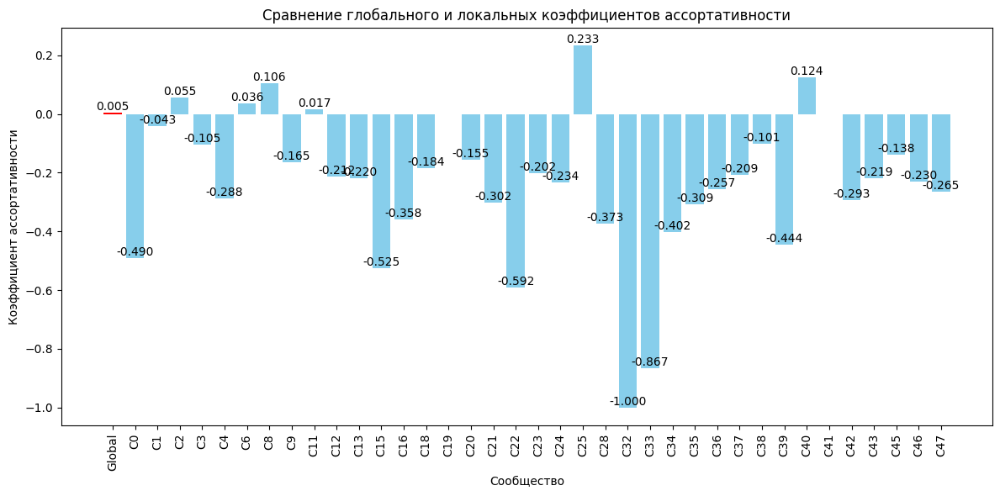

In [111]:
import pandas as pd

global_assortativity = nx.degree_assortativity_coefficient(Gcc)

partition = community_louvain.best_partition(Gcc, resolution = 6)
unique_regions = list(set(list(partition.values())))

region_assortativity = {}
for comm in unique_regions:
    nodes_in_comm = [n for n in Gcc.nodes() if partition[n] == comm]
    subgraph = Gcc.subgraph(nodes_in_comm)
    if subgraph.number_of_nodes() > 2 and subgraph.number_of_edges() > 0:
        try:
            assort = nx.degree_assortativity_coefficient(subgraph)
            region_assortativity[comm] = assort
        except nx.NetworkXError:
            region_assortativity[comm] = None
    else:
        region_assortativity[comm] = None

data = {
    'Community': ['Global'] + [f'C{comm}' for comm in region_assortativity.keys()],
    'Assortativity': [global_assortativity] + [
        region_assortativity[comm] if region_assortativity[comm] is not None else 0
        for comm in region_assortativity
    ]
}
df = pd.DataFrame(data)

# Фильтрация: оставляем глобальный столбец и только те сообщества, у которых значение не равно 0.
df_filtered = df[(df['Community'] == 'Global') | (df['Assortativity'] != 0)]

plt.figure(figsize=(12, 6))

colors = ['red' if comm == 'Global' else 'skyblue' for comm in df_filtered['Community']]
bars = plt.bar(df_filtered['Community'], df_filtered['Assortativity'], color=colors, edgecolor='none')

plt.title('Сравнение глобального и локальных коэффициентов ассортативности')
plt.xlabel('Сообщество')
plt.ylabel('Коэффициент ассортативности')
plt.xticks(rotation=90)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, f'{height:.3f}',
             ha='center', va='bottom')

plt.tight_layout()
plt.show()

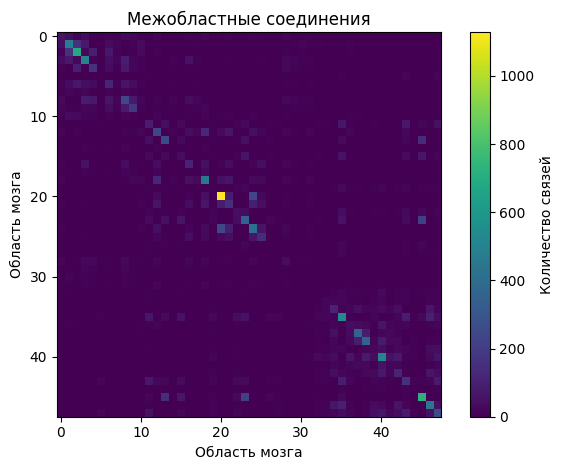

In [112]:
adj_matrix = np.zeros((len(unique_regions), len(unique_regions)))

for u, v in Gcc.edges():
    ru = partition[u]
    rv = partition[v]
    adj_matrix[ru, rv] += 1
    adj_matrix[rv, ru] += 1

plt.imshow(adj_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Количество связей')
plt.title('Межобластные соединения')
plt.xlabel('Область мозга')
plt.ylabel('Область мозга')
plt.tight_layout()
plt.show()

In [113]:
print(f"Ассортативность сети: {global_assortativity:.3f}")
print(f"Средняя ассортативность сообществ: {np.nanmean([x for x in region_assortativity.values() if x is not None]):.3f}")

Ассортативность сети: 0.005
Средняя ассортативность сообществ: -0.246


Наш коннектом имеет ассортативность, близкую к 0, что означает, что хабы в графе не очень-то стремятся соединяться с другими хабами, но сообщества имеют средние ассортативности, которые достаточно меньше нуля, а это значит, что наша разметка разбивает хабы по разным сообществам - так как межобластные связи также слабые, то соседи хабов находятся в разных сообществах.

## Задание 4. Транскраниальная магнитная стимуляция (30 баллов)

__[Транскраниальная магнитная стимуляция (ТМС)](https://ru.wikipedia.org/wiki/Транскраниальная_магнитная_стимуляция)__ - метод, позволяющий неинвазивно стимулировать кору головного мозга. Он применяется для реабелитации пациентов (например, с двигательными нарушениями), и для лечения различных заболеваний: болезни Паркинсона, эпилепсии, депрессии, шизофрении, и других.

Мы предлагаем вам провести ТМС вашего "пациента". Для этого нужно:

- "Взвесить" рёбра графа. Например, используя некоторую метрику, убывающую с ростом расстояния между вершинами

- Применить ТМС к различным областям мозга. Посмотреть, как далеко распространится сигнал, какие области затронет, за какие функции отвечают эти области.

  Для реализации распространения сигналов можно использовать различные методы: `message passing`, `random walk`, `heat diffusion` и другие.

  Попробуйте различные методы (два или больше), сравните результаты.

---

Чтобы выбрать, к каким областям мозга применять ТМС, можете использовать научные статьи, например:

__[Evidence-based guidelines on the therapeutic use of repetitive transcranial magnetic stimulation (rTMS)](https://www.sciencedirect.com/science/article/pii/S1388245719312799?via%3Dihub)__.

В этой статье приведено множество исследований, в которых стимулировали различные области мозга при помощи ТМС. Также, описаны симптомы пациентов и результаты применения ТМС.

---

Например, на картинке ниже вы можете видеть:

- Симптом пациентов - двигательное нарушение руки в результате инсульта

- Область применения ТМС - зона M1. Для ориентации в шифрах областей можете использовать __[карту областей мозга](https://atlas.brain-map.org/atlas?atlas=265297126)__

- Результат терапии - улучшение двигательных функций

![lab_1_example.png](attachment:lab_1_example.png)

---

Удачи Вам в работе!

In [114]:
for u, v in Gcc.edges():
    x1, y1, z1 = float(Gcc.nodes[u]['dn_position_x']), float(Gcc.nodes[u]['dn_position_y']), float(Gcc.nodes[u]['dn_position_z'])
    x2, y2, z2 = float(Gcc.nodes[v]['dn_position_x']), float(Gcc.nodes[v]['dn_position_y']), float(Gcc.nodes[v]['dn_position_z'])

    d = np.sqrt((x1-x2)**2 + (y1-y2)**2 + (z1-z2)**2)
    Gcc[u][v]['weight'] = 1.0 / (d + 1e-6)

    nodes = list(Gcc.nodes())

In [115]:
import random

def message_passing(G, source, iters):
    signals = {node: (1 if node == source else 0) for node in G.nodes()}
    for _ in range(iters):
        new_signals = {
            node: sum(edge_data.get('weight', 1) for _, edge_data in G.adj[node].items())
            for node in G.nodes()
        }
        signals = new_signals
    return signals


def heat_diffusion(G, start, iters):
    signals = {node: (1 if node == start else 0) for node in G.nodes()}
    for _ in range(iters):
        new_signals = {}
        for node, neighbors in G.adjacency():
            new_signals[node] = sum(
                neighbors[neigh].get('weight', 1) * signals.get(neigh, 0)
                for neigh in neighbors
            )
        signals = new_signals
    return signals

def random_walk(G, start, iters):
    signals = {node: 0 for node in G.nodes()}
    current = start
    signals[current] = 1
    for _ in range(iters):
        neighbors = list(G.adj[current].keys())
        if not neighbors:
            break
        weights = [G[current][nbr].get('weight', 1) for nbr in neighbors]
        current = random.choices(neighbors, weights=weights, k=1)[0]
        signals[current] = 1
    return signals

In [116]:
def start_node(G, region):
    nodes_in_region = []
    for node, data in G.nodes(data=True):
        if canonize_key(data.get('dn_name', 'Unknown')) == region:
            nodes_in_region.append(node)
    return random.choice(nodes_in_region)

Будем стимулировать области Superiorfrontal и Rostralmiddlefrontal, которые стимулируют при когнитивных нарушениях (ура, неврология)

In [117]:
regions = ["Superiorfrontal", "Rostralmiddlefrontal"]

for region in regions:
    target = start_node(G, region)

    mp_signals, hd_signals, rw_signals = message_passing(G, target, 10), heat_diffusion(G, target, 10), random_walk(G, target, 10)

    print(f"Стимуляция {region} с помощью message passing")
    plot_connectome(Gcc, node_colors=[mp_signals[node] for node in Gcc.nodes()], show_legend=False)
    print(f"Стимуляция {region} с помощью heat diffusion")
    plot_connectome(Gcc, node_colors=[hd_signals[node] for node in Gcc.nodes()], show_legend=False)
    print(f"Стимуляция {region} с помощью random walk")
    plot_connectome(Gcc, node_colors=[rw_signals[node] for node in Gcc.nodes()], show_legend=False)

Стимуляция Superiorfrontal с помощью message passing


Стимуляция Superiorfrontal с помощью heat diffusion


Стимуляция Superiorfrontal с помощью random walk


Стимуляция Rostralmiddlefrontal с помощью message passing


Стимуляция Rostralmiddlefrontal с помощью heat diffusion


Стимуляция Rostralmiddlefrontal с помощью random walk


Чем светлее отражается нейрон, тем сильнее он стимулируется - из этого факта можно сделать вывод, что наилучшим образом стимулирует нейроны метод heat diffusion.

При стимуляции различных областей мозга чаще всего стимулируются ближайшие друг к другу отделы, а это значит, что при стимуляции какого-то одного отдела мозга мы можем ненароком задеть и другие отделы.